In [86]:
import numpy as np
import pandas as pd
import seaborn as sns
import os

In [87]:
import nltk 
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sheot\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [88]:
import tensorflow as tf
import re

In [89]:
from matplotlib import pyplot as plt

In [90]:
from gensim.models import Word2Vec
from tensorflow.keras import preprocessing, Model

In [91]:
from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout, Embedding, MaxPool1D, Flatten, SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint

In [92]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [93]:
from sklearn.preprocessing import LabelEncoder

In [94]:
from string import punctuation as punct

In [95]:
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier as rfc
from sklearn.model_selection import GridSearchCV

In [96]:
punct += '«»–…'
punct

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~«»–…'

##### 0. Loading data

In [97]:
corpus_dir = 'rusage_age_based_clf/'

In [98]:
descr = pd.read_csv(corpus_dir + 'description.csv', delimiter = ';', header = None,
                   names = ['file', 'book', 'author', 'age', 'genre'])
descr

,file,book,author,age,genre
0,children_1.txt,Три четверти,Анна Красильщик,12,Детская проза|Детские книги
1,children_2.txt,Повести и рассказы,Аркадий Гайдар,12,Детская проза|Детские книги
2,children_3.txt,"Оленёнок Крапинка, или Бархатистый носик",Холли Вебб,6,Детская проза|Детские книги
3,children_4.txt,Сара и роль мечты,Холли Вебб,6,Детская проза|Детские книги
4,children_5.txt,Как Гитлер украл розового кролика,Джудит Керр,6,Детская проза|Детские книги
...,...,...,...,...,...
5487,adults_2880.txt,Психея,Ellen Fallen,18,Остросюжетные любовные романы|Любовные романы
5488,adults_2881.txt,Мои шальные звезды,Екатерина Азарова,16,Любовно-фантастические романы|Любовные романы
5489,adults_2882.txt,Редкий тип мужчины,Андрей Ромм,16,Остросюжетные любовные романы|Любовные романы
5490,adults_2883.txt,Похить мое сердце дважды,Кэтрин Манн,16,Зарубежные любовные романы|Любовные романы


In [99]:
train, test = {'name': os.listdir(os.path.join(corpus_dir, 'train/')), 'abstract': [], 'preview' : [], 'text' : []}, {'name': os.listdir(os.path.join(corpus_dir, 'test/')), 'abstract': [], 'preview' : [], 'text' : []}

for d_id, dataset in enumerate((train, test)):
    
    ds = 'train/' if d_id == 0 else 'test/'
    
    for filename in dataset['name']:
        
        with open(os.path.join(corpus_dir, ds, filename), 'r', encoding = 'utf-8') as f:
            
            dataset['text'].append(f.read().replace('\n', ' '))
    
        for folder in ('abstracts/', 'previews/'):
            
            with open(os.path.join(corpus_dir, folder, filename), 'r', encoding = 'utf-8') as f:
                
                booktext = f.read().replace('\n', ' ')
                
                eofragment = re.search('Конец ознакомительного фрагмента', booktext)
                
                if eofragment: 
                    
                    booktext = booktext[:eofragment.span()[0]]
            
                dataset[folder[:-2]].append(booktext)


In [100]:
train, test = pd.DataFrame(train), pd.DataFrame(test)
train

,name,abstract,preview,text
0,adults_1.txt,"Это книга личных драм, подлинных катастроф и б...","Линии Рю Мураками Это книга личных драм, под...",Линии Рю Мураками Рю Мураками Линии ...
1,adults_10.txt,"Истории, собранные в этой книге, очень разные ...",Далекое-далекое лето Татьяна Владимировна Янко...,Далекое-далекое лето Татьяна Владимировна Янко...
2,adults_100.txt,Год назад жизнь Аннабель не казалась идеальной...,Отдаю свое сердце миру Деб Калетти Год назад...,Отдаю свое сердце миру Деб Калетти Год назад...
3,adults_1000.txt,В новую книгу Саши Кругосветова вошли рассказы...,Уже или ещё (сборник) Саша Кругосветов Литер...,Уже или ещё (сборник) Саша Кругосветов Литер...
4,adults_1001.txt,Вечеринка в доме у Джона. Все как в тумане.Мно...,Не нужно молчать Аарон Хартцлер Trendbooks m...,Не нужно молчать Аарон Хартцлер Trendbooks m...
...,...,...,...,...
4487,children_995.txt,"Представь себе, что ты – последний обычный чел...",Уровень Пи Ая эН Мутангелы #1 Представь себе...,Уровень Пи Ая эН Мутангелы #1 Представь себе...
4488,children_996.txt,В Эдеме произошло непоправимое – по вине Бусла...,Ошибка грифона Дмитрий Александрович Емец Ме...,Ошибка грифона Дмитрий Александрович Емец Ме...
4489,children_997.txt,Во второй книге серии «Пилигримы» – «Искры и х...,Искры и химеры Дорофея Ларичева Пилигримы #2...,Искры и химеры Дорофея Ларичева Пилигримы #2...
4490,children_998.txt,Законы реальности просто так не нарушишь. Везе...,Сон Видящей Алексей Александрович Олейников ...,Сон Видящей Алексей Александрович Олейников ...


In [101]:
test

,name,abstract,preview,text
0,adults_1890.txt,Сборник «Рассказы о пилоте Пирксе» – одна из ж...,Рассказы о пилоте Пирксе (сборник) Станислав Г...,Рассказы о пилоте Пирксе (сборник) Станислав Г...
1,adults_1891.txt,"Михаил Булыух – российский писатель-фантаст, р...",Аццкий Нуб Михаил Валерьевич Булыух LitRPGГр...,Аццкий Нуб Михаил Валерьевич Булыух LitRPGГр...
2,adults_1892.txt,Совсем недавно отгремела очередная мировая вой...,Тень хранителя Алексей Байкалов Современный ...,Тень хранителя Алексей Байкалов Современный ...
3,adults_1893.txt,"Лесногорской аномалии больше нет, но угроза не...",Вирус Зоны. Сеятель Дмитрий Владимирович Лазар...,Вирус Зоны. Сеятель Дмитрий Владимирович Лазар...
4,adults_1894.txt,Второй шанс пожилого учителя истории. Его Роди...,Я спас СССР. Том I Алексей Викторович Вязовски...,Я спас СССР. Том I Алексей Викторович Вязовски...
...,...,...,...,...
995,children_2604.txt,Маня была обижена на весь свет: каникулы подхо...,Маскировка для злодейки Екатерина Николаевна В...,Маскировка для злодейки Екатерина Николаевна В...
996,children_2605.txt,Странные дела творятся в этом старом доме. Спл...,За дверью – тайна… Екатерина Николаевна Вильмо...,За дверью – тайна… Екатерина Николаевна Вильмо...
997,children_2606.txt,Арине. Вите и Антоше очень хотелось помочь сво...,Пудель бродит по Европе Елена Вячеславовна Нес...,Пудель бродит по Европе Елена Вячеславовна Нес...
998,children_2607.txt,Часто ли работники милиции обращаются к подрос...,Секрет убегающей тени Екатерина Николаевна Вил...,Секрет убегающей тени Екатерина Николаевна Вил...


Text(0.5, 0, 'age')

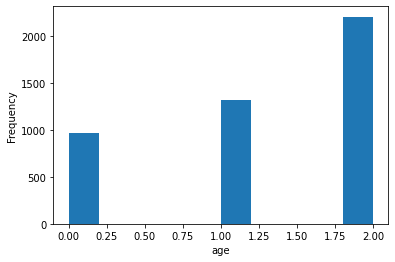

In [193]:
ax = descr[descr.file.isin(train.name)].age.plot.hist()
ax.set_xlabel("age")

Text(0.5, 0, 'age')

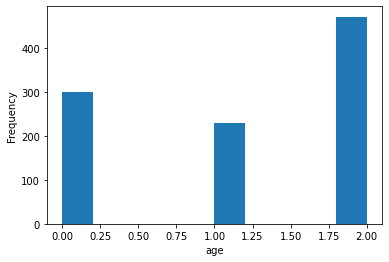

In [192]:
ax = descr[descr.file.isin(test.name)].age.plot.hist()
ax.set_xlabel("age")

Видно, что данные по возрастам распределены неравномерно. Чтобы это исправить, объединим тексты в 3 возрастные категории: детские (до 10 лет вкл-но), подростковые (11-15 лет), взрослые (16-18)

In [104]:
descr.age.value_counts()

16    1963
12    1544
6     1242
18     717
8       14
3       10
11       1
5        1
Name: age, dtype: int64

In [105]:
bins = [0, 10, 15, 18]
labels = ['children (0-10)', 'teens (11-15)', 'adults (16-18)']

binned_train = pd.cut(descr[descr.file.isin(train.name)].age, bins=bins, labels=labels)
binned_test = pd.cut(descr[descr.file.isin(test.name)].age, bins=bins, labels=labels)

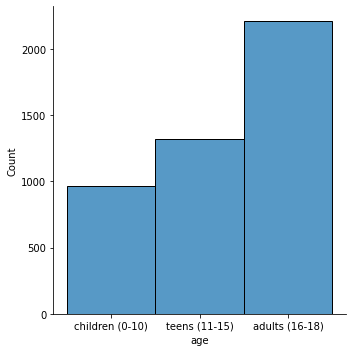

In [106]:
sns.displot(binned_train)

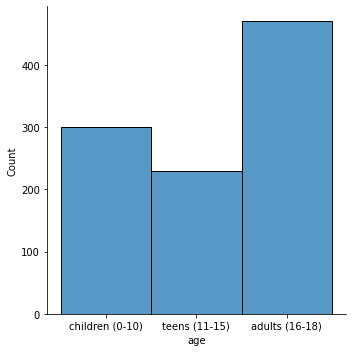

In [107]:
sns.displot(binned_test)

Классы все еще несбалансированы, однако теперь для каждого есть репрезентативная выборка.

In [108]:
def age_to_category(age):
    
    if age < 11: return 0
    
    elif age <16: return 1
    
    return 2

In [109]:
descr.age = descr.age.apply(age_to_category)

In [110]:
descr

,file,book,author,age,genre
0,children_1.txt,Три четверти,Анна Красильщик,1,Детская проза|Детские книги
1,children_2.txt,Повести и рассказы,Аркадий Гайдар,1,Детская проза|Детские книги
2,children_3.txt,"Оленёнок Крапинка, или Бархатистый носик",Холли Вебб,0,Детская проза|Детские книги
3,children_4.txt,Сара и роль мечты,Холли Вебб,0,Детская проза|Детские книги
4,children_5.txt,Как Гитлер украл розового кролика,Джудит Керр,0,Детская проза|Детские книги
...,...,...,...,...,...
5487,adults_2880.txt,Психея,Ellen Fallen,2,Остросюжетные любовные романы|Любовные романы
5488,adults_2881.txt,Мои шальные звезды,Екатерина Азарова,2,Любовно-фантастические романы|Любовные романы
5489,adults_2882.txt,Редкий тип мужчины,Андрей Ромм,2,Остросюжетные любовные романы|Любовные романы
5490,adults_2883.txt,Похить мое сердце дважды,Кэтрин Манн,2,Зарубежные любовные романы|Любовные романы


In [111]:
train = train.merge(descr[['file', 'age']], how ='left', left_on = 'name', right_on ='file')
test = test.merge(descr[['file', 'age']], how ='left', left_on = 'name', right_on ='file')

In [112]:
train

,name,abstract,preview,text,file,age
0,adults_1.txt,"Это книга личных драм, подлинных катастроф и б...","Линии Рю Мураками Это книга личных драм, под...",Линии Рю Мураками Рю Мураками Линии ...,adults_1.txt,2
1,adults_10.txt,"Истории, собранные в этой книге, очень разные ...",Далекое-далекое лето Татьяна Владимировна Янко...,Далекое-далекое лето Татьяна Владимировна Янко...,adults_10.txt,2
2,adults_100.txt,Год назад жизнь Аннабель не казалась идеальной...,Отдаю свое сердце миру Деб Калетти Год назад...,Отдаю свое сердце миру Деб Калетти Год назад...,adults_100.txt,2
3,adults_1000.txt,В новую книгу Саши Кругосветова вошли рассказы...,Уже или ещё (сборник) Саша Кругосветов Литер...,Уже или ещё (сборник) Саша Кругосветов Литер...,adults_1000.txt,2
4,adults_1001.txt,Вечеринка в доме у Джона. Все как в тумане.Мно...,Не нужно молчать Аарон Хартцлер Trendbooks m...,Не нужно молчать Аарон Хартцлер Trendbooks m...,adults_1001.txt,2
...,...,...,...,...,...,...
4487,children_995.txt,"Представь себе, что ты – последний обычный чел...",Уровень Пи Ая эН Мутангелы #1 Представь себе...,Уровень Пи Ая эН Мутангелы #1 Представь себе...,children_995.txt,1
4488,children_996.txt,В Эдеме произошло непоправимое – по вине Бусла...,Ошибка грифона Дмитрий Александрович Емец Ме...,Ошибка грифона Дмитрий Александрович Емец Ме...,children_996.txt,2
4489,children_997.txt,Во второй книге серии «Пилигримы» – «Искры и х...,Искры и химеры Дорофея Ларичева Пилигримы #2...,Искры и химеры Дорофея Ларичева Пилигримы #2...,children_997.txt,1
4490,children_998.txt,Законы реальности просто так не нарушишь. Везе...,Сон Видящей Алексей Александрович Олейников ...,Сон Видящей Алексей Александрович Олейников ...,children_998.txt,1


In [113]:
from wordcloud import WordCloud

##### 1. Preprocessing

In [114]:
stop_words = stopwords.words('russian')
stemmer = SnowballStemmer('russian')

In [115]:
class PreprocessedText():
    
    def __init__(self, dataset, emb_size = 100, maxlen = 30, x_col = 'abstract', y_col = 'age'):
        
        self.trained = False
        self.x_col = x_col
        self.y_col = y_col
        
        self.data_raw = dataset[x_col]
        
        self.emb_size = emb_size
        
        self.maxlen = maxlen
        
        print('Preprocessing...')
        self.preprocess_ds()
        print('Creating lookup dictionary...')
        self.create_lookup()
        print('Creating embeddings...')
        self.create_embedding_matrix()
        print('Padding...')
        self.X_padded = self.pad()
        print('Vectorizing texts...')
        self.X = self.text_to_veq()
        print('Encoding labels...')
        self.encode_labels(dataset[y_col])
        
        self.trained = True
        

    def clean_and_stem(self, text, stem = True):

        res = []

        sents = nltk.sent_tokenize(text.lower())

        whole_text = []

        for sent in sents:
            
            if stem:

                word_tokens = [stemmer.stem(w.strip(punct).lower()) for w in nltk.word_tokenize(sent) if w not in stop_words
                               and w not in punct]
                
                word_tokens = [st_w for st_w in word_tokens if st_w not in stop_words] #for stemmed stop-words
                
            else:
                
                word_tokens = [w.strip(punct).lower() for w in nltk.word_tokenize(sent) if w not in stop_words
                          and w not in punct]
                
            res.append(word_tokens)
            whole_text.extend(word_tokens)

        return res, whole_text
    
    def preprocess_ds(self):
        
        data = self.data_raw if not self.trained else self.data_raw_test
        
        self.all_sents = [] #list of all word-tokenized tokenized sentences in a dataset 
        self.all_texts = [] #list of all word-tokenized texts in a dataset
        
        for txt in data:
            
            s, w = self.clean_and_stem(txt)
            self.all_sents.extend(s)
            self.all_texts.append(w)
    
    def create_lookup(self):
        
        assert not self.trained
        
        self.tokenizer = preprocessing.text.Tokenizer(lower=True, split='', 
                     oov_token="NaN", 
                     filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n' + punct)
        
        self.tokenizer.fit_on_texts(self.all_sents)

        self.tokenizer.word_index = {k: v-1 for k,v in self.tokenizer.word_index.items()}
        self.lookup = self.tokenizer.word_index
        self.lookup_r = {v: k for k, v in self.lookup.items()} #reversed
        
    def create_embedding_matrix(self):
        
        self.embs = Word2Vec(sentences=self.all_sents, size= self.emb_size, window=5, min_count=1)
        
        self.embedding_matrix = np.zeros((len(self.lookup), self.emb_size))

        for word in list(self.lookup.keys())[1:]: #NaN excluded

            self.embedding_matrix[self.lookup[word],:] = self.embs.wv[word]
        
        
    def pad(self):
        
        seq = self.tokenizer.texts_to_sequences(self.all_texts)

        X_padded = preprocessing.sequence.pad_sequences(seq, 
                    maxlen=self.maxlen, padding="post", truncating="post")
        
        return X_padded
        
    def text_to_veq(self):
        
        padded = self.X_padded if not self.trained else self.X_test_padded
        
        X = np.zeros((padded.shape[0], self.maxlen * self.embedding_matrix.shape[1]))

        for row in range(X.shape[0]):
    
            X[row,:] = np.array([self.embedding_matrix[wordind] for wordind in padded[row]]).flatten()
        
        return X
        
        
    def preprocess_test(self, test_data):
        
        assert self.trained
        
        self.data_raw_test = test_data[self.x_col]
        
        self.preprocess_ds()
        self.X_test_padded = self.pad()
        self.X_test = self.text_to_veq()
        self.encode_labels(test_data[self.y_col])
        
    def encode_labels(self, data):
        
        if not self.trained:
            self.encoder = LabelEncoder()
            self.encoder.fit(data.to_list())
            self.y = tf.one_hot(self.encoder.transform(data.to_list()), max(data) + 1)
        else:
            self.y_test = tf.one_hot(self.encoder.transform(data.to_list()), max(data) + 1)

In [116]:
prepr = PreprocessedText(train)

Preprocessing...
Creating lookup dictionary...
Creating embeddings...
Padding...
Vectorizing texts...
Encoding labels...


In [117]:
train.loc[:,'clean'] = [' '.join(text) for text in prepr.all_texts]

In [118]:
prepr.preprocess_test(test)

In [119]:
test.loc[:,'clean'] = [' '.join(text) for text in prepr.all_texts]

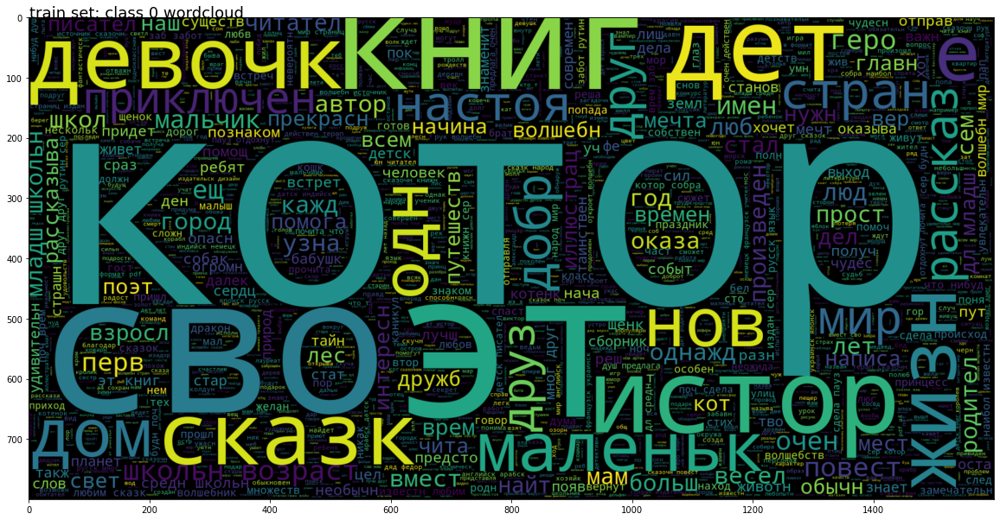

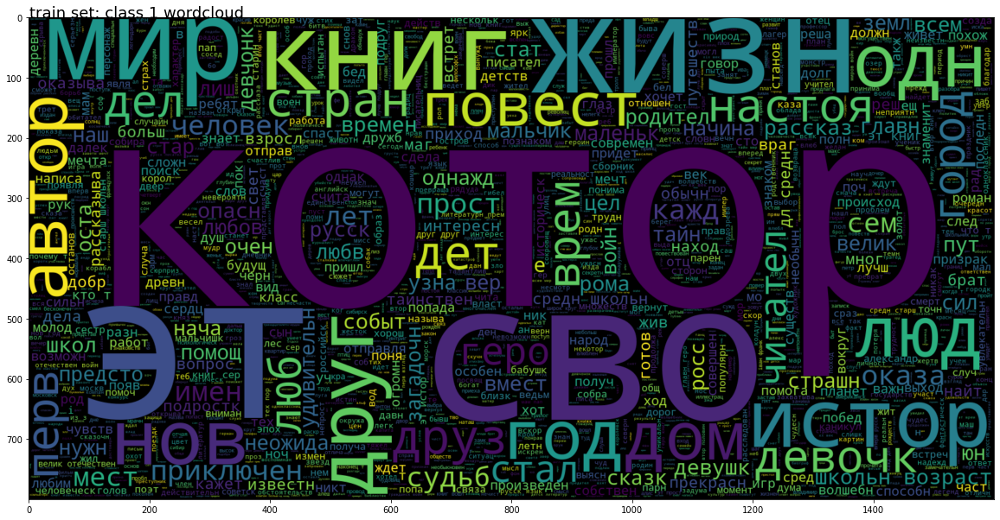

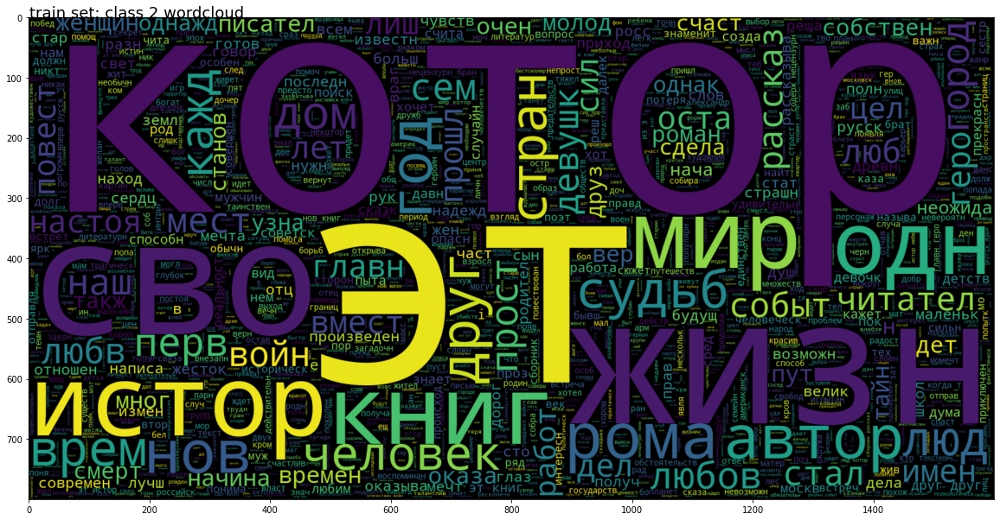

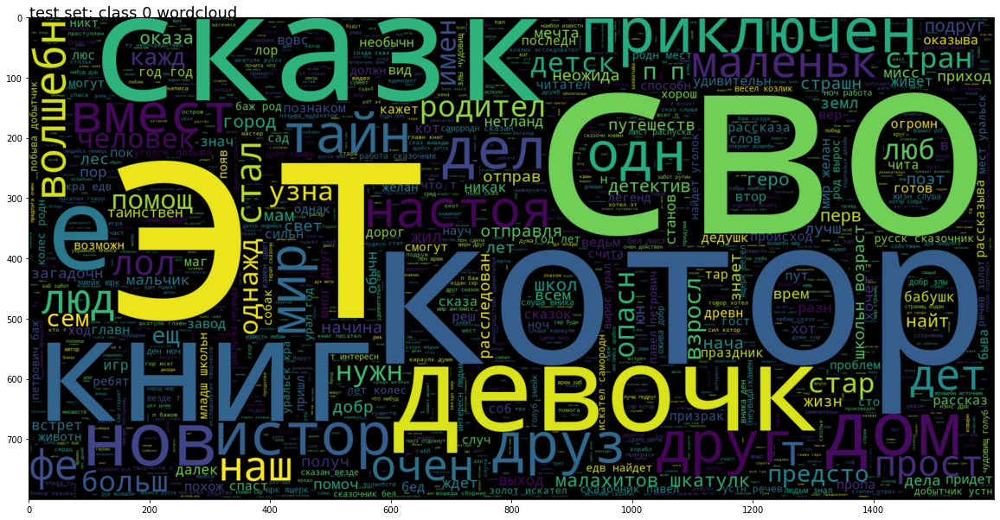

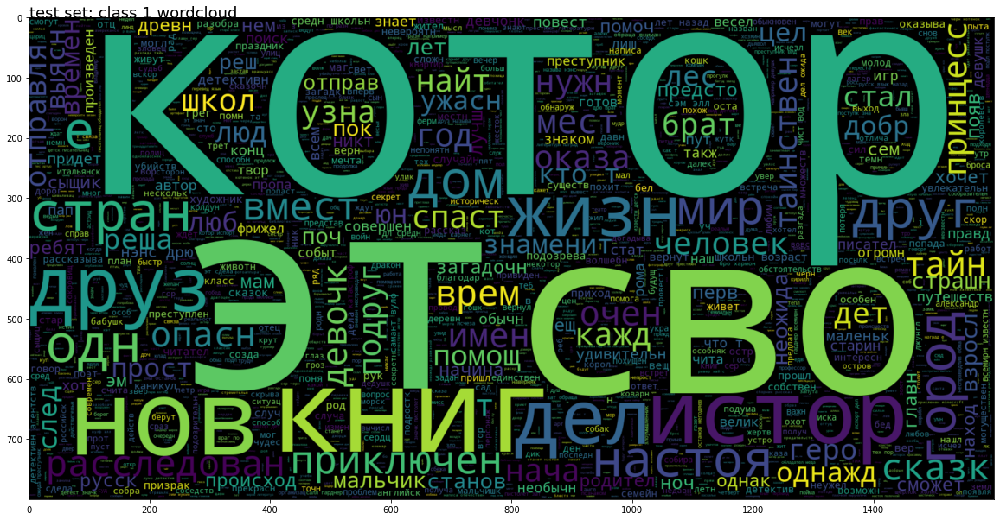

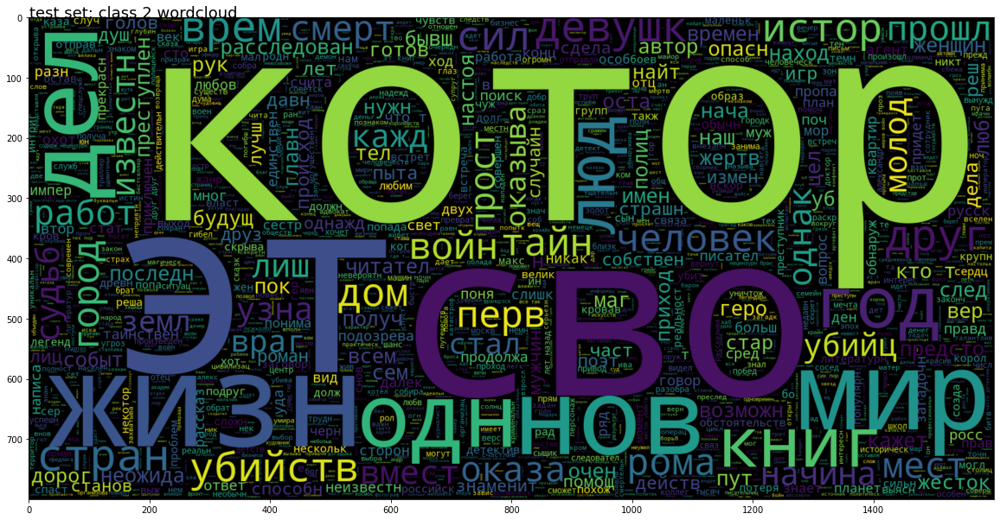

In [120]:
for ind, ds in enumerate((train, test)):
    _ds = 'train' if ind == 0 else 'test'
    for age in range(3):
        plt.figure(figsize = (20,20)) 
        wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(ds[ds.age == age].clean))
        plt.imshow(wc , interpolation = 'bilinear')
        plt.text(x = 0.5, y = 0.5, s = f'{_ds} set: class {age} wordcloud', fontsize = 18)
        plt.show()

In [121]:
assert prepr.X.shape[1] == prepr.X_test.shape[1]

##### 2. Prediction

In [122]:
ReduceLROnP = ReduceLROnPlateau(factor=0.1,
                                     min_lr = 1e-6,
                                     monitor = 'val_loss',
                                patience = 5,
                                     verbose = True)

CNN:

In [123]:
embedding_layer2 = Embedding(prepr.embedding_matrix.shape[0],
                                          prepr.embedding_matrix.shape[1],
                                          weights=[prepr.embedding_matrix],
                                          input_length=prepr.maxlen,
                                          trainable=True)

sequence_input2 = Input(shape=(prepr.maxlen,), dtype='int32')
embedding_sequences2 = embedding_layer2(sequence_input2)
x2 = Conv1D(128, 8)(embedding_sequences2)
x2 = MaxPool1D()(x2)
x2 = Dropout(0.5)(x2)
x2 = Conv1D(256, 6, activation = 'relu')(x2)
x2 = MaxPool1D()(x2)
x2 = Dense(256)(x2)
x2 = Dropout(0.5)(x2)
x2 = Flatten()(x2)
out = Dense(3, activation='softmax')(x2)

model2 = Model(sequence_input2, out)
model2.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy',
              metrics=['accuracy'])

print("Training on GPU...") if tf.test.is_gpu_available() else print("Training on CPU...")

hist = model2.fit(prepr.X_padded, prepr.y, batch_size=64, epochs=50, validation_data=(prepr.X_test_padded, prepr.y_test), callbacks=[ReduceLROnP])

Training on GPU...
Epoch 1/50
71/71 [==============================] - 2s 19ms/step - loss: 1.1169 - accuracy: 0.4299 - val_loss: 1.0715 - val_accuracy: 0.4710 - lr: 1.0000e-04
Epoch 2/50
71/71 [==============================] - 1s 12ms/step - loss: 1.0617 - accuracy: 0.4662 - val_loss: 1.0617 - val_accuracy: 0.4810 - lr: 1.0000e-04
Epoch 3/50
71/71 [==============================] - 1s 13ms/step - loss: 1.0526 - accuracy: 0.4804 - val_loss: 1.0682 - val_accuracy: 0.4770 - lr: 1.0000e-04
Epoch 4/50
71/71 [==============================] - 1s 11ms/step - loss: 1.0372 - accuracy: 0.4795 - val_loss: 1.1056 - val_accuracy: 0.4640 - lr: 1.0000e-04
Epoch 5/50
71/71 [==============================] - 1s 11ms/step - loss: 1.0326 - accuracy: 0.4833 - val_loss: 1.0617 - val_accuracy: 0.4790 - lr: 1.0000e-04
Epoch 6/50
71/71 [==============================] - 1s 11ms/step - loss: 1.0315 - accuracy: 0.4938 - val_loss: 1.0636 - val_accuracy: 0.4810 - lr: 1.0000e-04
Epoch 7/50
67/71 [===============

71/71 [==============================] - 1s 11ms/step - loss: 0.9922 - accuracy: 0.5171 - val_loss: 1.0723 - val_accuracy: 0.4780 - lr: 1.0000e-06


SVM & Random Forest:

In [124]:
clfs = {
'rfc' : [rfc(random_state=0), {'n_estimators': range(30,71,10), 'max_depth': range(5,31,5)}],
'svm' : [svm.SVC(), {'kernel':('linear', 'poly') }],
}

In [125]:
for clf in clfs:
    gridsearch = GridSearchCV(clfs[clf][0], clfs[clf][1])
    gridsearch.fit(prepr.X, np.where(prepr.y)[1])
    clfs[clf][0] = gridsearch.best_estimator_
    clfs[clf].append(clfs[clf][0].score(prepr.X_test, np.where(prepr.y_test)[1]))
    clfs[clf].append(clfs[clf][0].score(prepr.X, np.where(prepr.y)[1]))
    print(f'{clf} : Test acc for best clf: {clfs[clf][-2]}, Train acc: {clfs[clf][-1]}')

rfc : Test acc for best clf: 0.488, Train acc: 0.8107747105966162
svm : Test acc for best clf: 0.495, Train acc: 0.5603294746215495


BiLSTM:

In [126]:
embedding_layer = Embedding(prepr.embedding_matrix.shape[0],
                                          prepr.embedding_matrix.shape[1],
                                          weights=[prepr.embedding_matrix],
                                          input_length=prepr.maxlen,
                                          trainable=True)

In [127]:
sequence_input = Input(shape=(prepr.maxlen,), dtype='int32')
embedding_sequences = embedding_layer(sequence_input)

In [128]:
x = SpatialDropout1D(0.2)(embedding_sequences)
x = Bidirectional(LSTM(128,return_sequences=True))(x)
x = Dropout(0.3)(x)
x = Bidirectional(LSTM(128,return_sequences=True))(x)
x = Flatten()(x)
x = Dense(128, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(64, activation="relu")(x)
x = Dropout(0.5)(x)
outputs = Dense(3, activation="softmax")(x)

In [129]:
model = Model(sequence_input, outputs)

In [130]:
model.compile(optimizer=Adam(learning_rate=1e-3), loss='categorical_crossentropy',
              metrics=['accuracy'])

In [131]:
print("Training on GPU...") if tf.test.is_gpu_available() else print("Training on CPU...")

Training on GPU...


In [132]:
hist = model.fit(prepr.X_padded, prepr.y, batch_size=64, epochs=50,
                    validation_data=(prepr.X_test_padded, prepr.y_test), callbacks=[ReduceLROnP])

Epoch 1/50
71/71 [==============================] - 12s 52ms/step - loss: 1.0871 - accuracy: 0.4321 - val_loss: 1.0716 - val_accuracy: 0.4710 - lr: 0.0010
Epoch 2/50
71/71 [==============================] - 2s 25ms/step - loss: 1.0562 - accuracy: 0.4817 - val_loss: 1.0801 - val_accuracy: 0.4710 - lr: 0.0010
Epoch 3/50
71/71 [==============================] - 2s 25ms/step - loss: 1.0462 - accuracy: 0.4866 - val_loss: 1.0679 - val_accuracy: 0.4710 - lr: 0.0010
Epoch 4/50
71/71 [==============================] - 2s 25ms/step - loss: 1.0414 - accuracy: 0.4913 - val_loss: 1.0576 - val_accuracy: 0.4710 - lr: 0.0010
Epoch 5/50
71/71 [==============================] - 4s 51ms/step - loss: 0.9422 - accuracy: 0.5265 - val_loss: 0.8581 - val_accuracy: 0.6130 - lr: 0.0010
Epoch 6/50
71/71 [==============================] - 2s 24ms/step - loss: 0.6338 - accuracy: 0.6961 - val_loss: 0.9438 - val_accuracy: 0.5810 - lr: 0.0010
Epoch 7/50
71/71 [==============================] - 2s 25ms/step - loss: 0.

Epoch 49/50
71/71 [==============================] - 2s 29ms/step - loss: 0.0182 - accuracy: 0.9960 - val_loss: 4.3535 - val_accuracy: 0.4920 - lr: 1.0000e-06
Epoch 50/50
71/71 [==============================] - 2s 29ms/step - loss: 0.0163 - accuracy: 0.9973 - val_loss: 4.3543 - val_accuracy: 0.4920 - lr: 1.0000e-06


Видно, что CNN и Random Forest не смогли качественно обучиться на данных, в то время как SVM и BiLSTM переобучились: у обеих высокая точность на тренировочном датасете и низкая - на тестовом.

##### 3. Improvements

Попробуем улучшить результаты, используя следующее:

- Добавим в стоп-слова некоторые наиболее частотные, которые встречаются во всех классах;
- Увеличим размерность текстовых вложений: теперь она составляет 150% от средней длины текстов в тренировочном датасете (слишком большое значение сделает векторы неразличимыми, при слишком маленьком размер словаря будет недостаточно большим);
- Т.к. классы несбалансированы даже после объединения, имеет смысл добавить веса, обратно пропорциональные частоте классов;
- Добавим новый признак - среднюю длину слов в тексте (судя по гистограмме ниже, плотность распределения длин слов для каждого класса незначительно, но различается);
- Увеличим количество слоев в нейронной сети: объединим свертку и BiLSTM-слои.


In [133]:
stop_stems =['сам', 'эт', 'сво', 'котор', 'книг', 'так']
stop_words.extend(stop_stems)

In [162]:
stop_words[-7:]

['между', 'сам', 'эт', 'сво', 'котор', 'книг', 'так']

In [195]:
class PreprocessedTextNew(PreprocessedText):
    
    def __init__(self, dataset, emb_size = 100, maxlen = 80, x_col = 'abstract', y_col = 'age'):
        
        super().__init__(dataset, emb_size, maxlen, x_col, y_col)
        
        
    def create_embedding_matrix(self, normalize = True):
        
        self.embs = Word2Vec(sentences=self.all_sents, size= self.emb_size, window=5, min_count=1)
        
        self.embedding_matrix = np.zeros((len(self.lookup), self.emb_size + 1))

        for word in list(self.lookup.keys())[1:]: #NaN excluded

            self.embedding_matrix[self.lookup[word],:] = np.concatenate([self.embs.wv[word], [len(word)]])
            
        if normalize:
            
            self.embedding_matrix[:,-1] /= np.sum(self.embedding_matrix[:,-1])
            
    def pad(self):
        
        seq = self.tokenizer.texts_to_sequences(self.all_texts)
        
        if not self.trained: self.maxlen = round(np.mean([len(s) for s in self.all_texts]) * 1.5)

        X_padded = preprocessing.sequence.pad_sequences(seq, 
                    maxlen=self.maxlen, padding="post", truncating="post")
        
        return X_padded
        
    

In [196]:
def compute_weights(labels, one_hot = True, sample = True):
    
    if one_hot:
        
        labels = np.where(labels)[1]
        
    n_samples = labels.shape[0]
    
    unique_classes = np.unique(labels)
    
    if sample:
        
        return np.array([n_samples / (unique_classes.shape[0] * np.where(labels == cl)[0].shape[0]) for cl in labels])
    
    return {cl : n_samples / (unique_classes.shape[0] * np.where(labels == cl)[0].shape[0]) for cl in unique_classes}

In [197]:
prepr_new = PreprocessedTextNew(train)

Preprocessing...
Creating lookup dictionary...
Creating embeddings...
Padding...
Vectorizing texts...
Encoding labels...


In [198]:
train.loc[:,'clean'] = [' '.join(text) for text in prepr_new.all_texts]

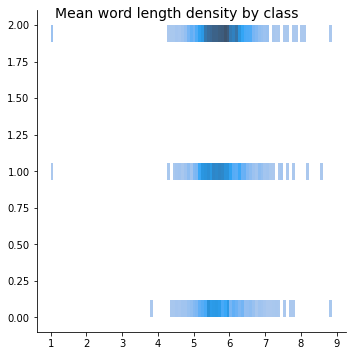

In [201]:
plot = sns.displot(x = [np.mean([len(w) for w in text]) for text in prepr_new.all_texts],
            y = np.argmax(prepr_new.y, axis = 1))

plot.fig.suptitle("Mean word length density by class",
                  fontsize=14, fontdict={"weight": "bold"})
plt.show()

In [184]:
prepr_new.preprocess_test(test)

In [186]:
test.loc[:,'clean'] = [' '.join(text) for text in prepr_new.all_texts]

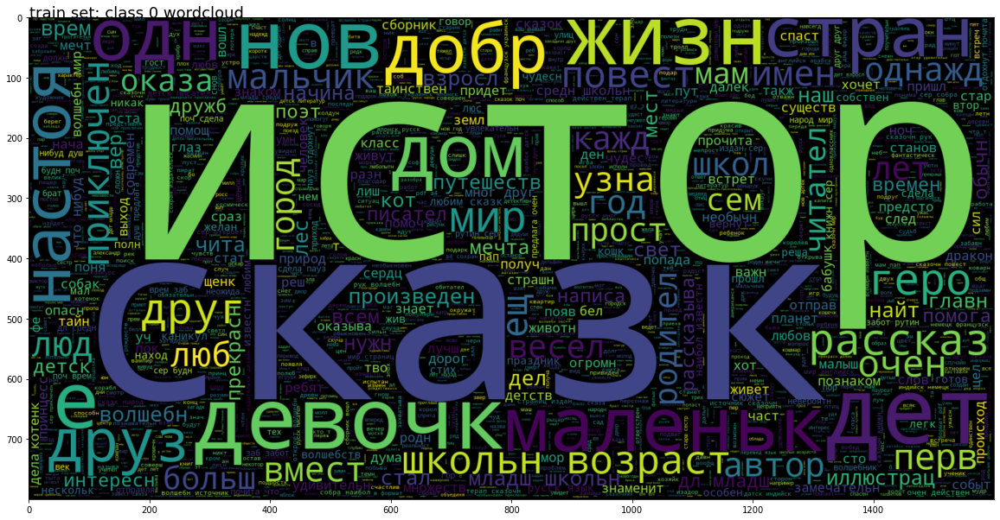

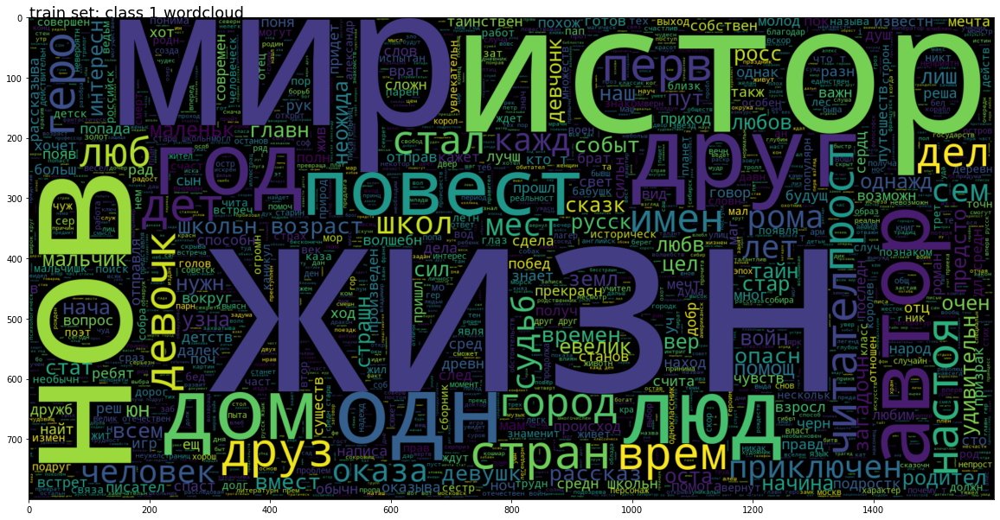

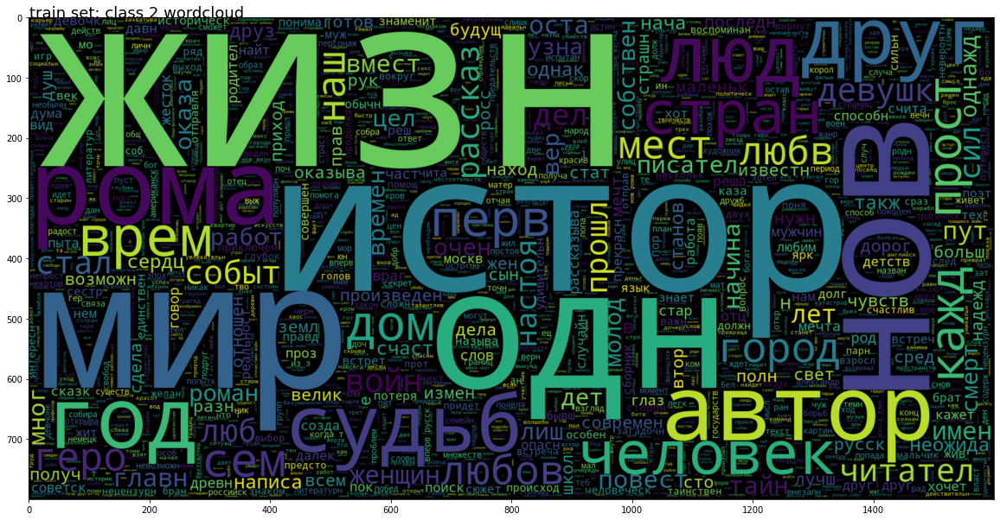

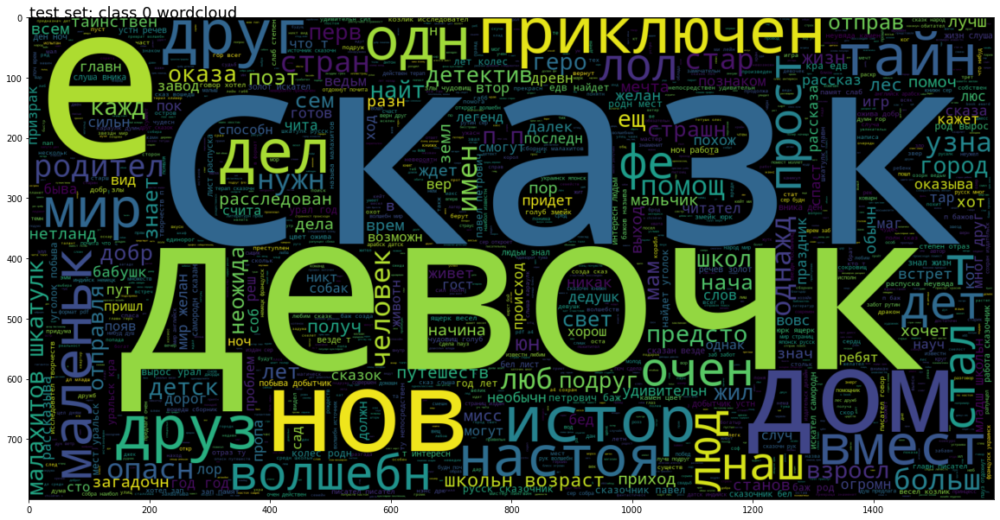

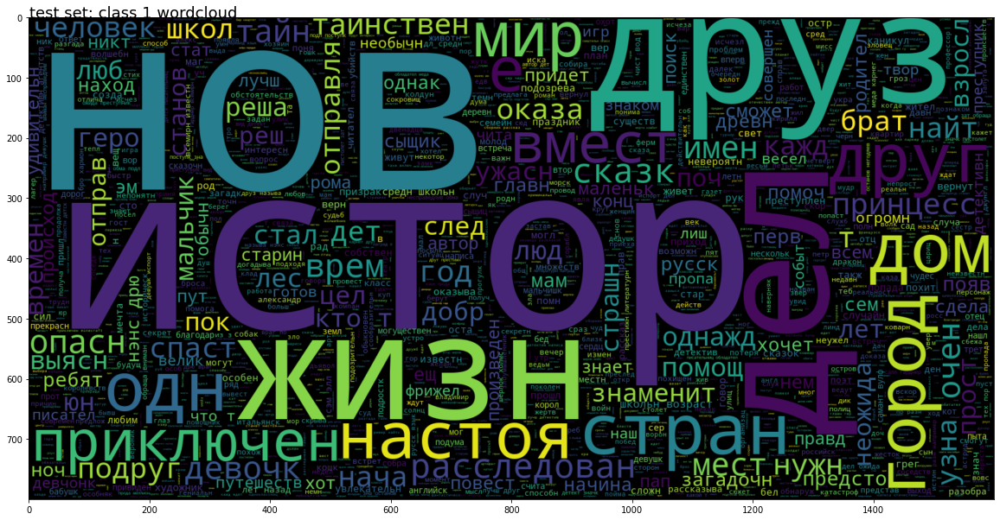

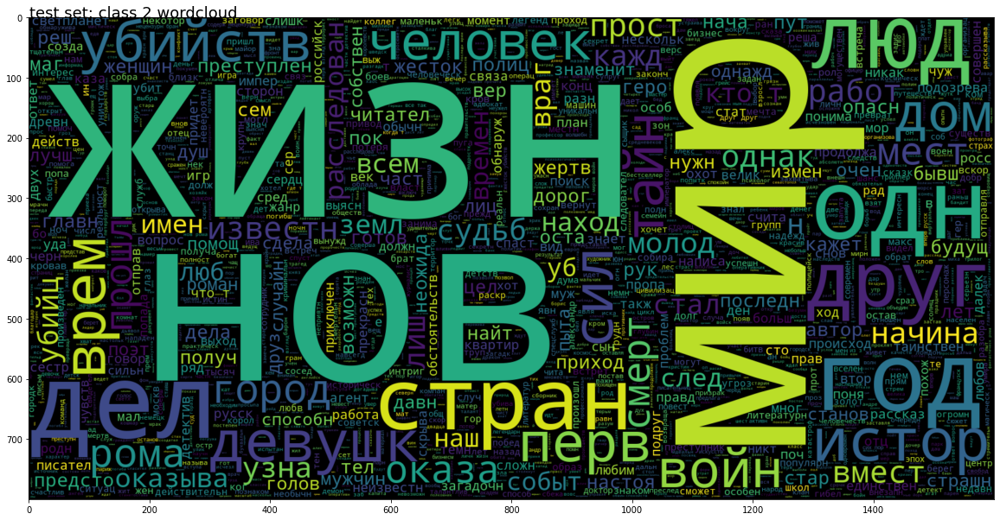

In [187]:
for ind, ds in enumerate((train, test)):
    _ds = 'train' if ind == 0 else 'test'
    for age in range(3):
        plt.figure(figsize = (20,20)) 
        wc = WordCloud(max_words = 2000 , width = 1600 , height = 800).generate(" ".join(ds[ds.age == age].clean))
        plt.imshow(wc , interpolation = 'bilinear')
        plt.text(x = 0.5, y = 0.5, s = f'{_ds} set: class {age} wordcloud', fontsize = 18)
        plt.show()

CNN + BiLSTM

In [189]:
embedding_layer = Embedding(prepr_new.embedding_matrix.shape[0],
                                          prepr_new.embedding_matrix.shape[1],
                                          weights=[prepr_new.embedding_matrix],
                                          input_length=prepr_new.maxlen,
                                          trainable=True)

sequence_input = Input(shape=(prepr_new.maxlen,), dtype='int32')
embedding_sequences = embedding_layer(sequence_input)

x3 = SpatialDropout1D(0.2)(embedding_sequences)
x3 = Bidirectional(LSTM(128,return_sequences=True))(x3)
x3 = Conv1D(128,8)(x3)
x3 = MaxPool1D()(x3)
x3 = Bidirectional(LSTM(256,return_sequences=True))(x3)
x3 = Conv1D(128,6)(x3)
x3 = MaxPool1D()(x3)
x3 = Bidirectional(LSTM(128,return_sequences=True))(x3)
x3 = Conv1D(128,3)(x3)
x3 = MaxPool1D()(x3)
x3 = Flatten()(x3)
x3 = Dropout(0.5)(x3)
x3 = Dense(128, activation="relu")(x3)
x3 = Dropout(0.5)(x3)
x3 = Dense(64, activation="relu")(x3)
x3 = Dropout(0.5)(x3)
outputs = Dense(3, activation="softmax")(x3)

model3 = Model(sequence_input, outputs)

model3.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy',
              metrics=['accuracy'])
hist = model3.fit(prepr_new.X_padded, prepr_new.y, batch_size=64, epochs=50, sample_weight = compute_weights(prepr_new.y),
                    validation_data=(prepr_new.X_test_padded, prepr_new.y_test), callbacks=[ReduceLROnP])

Epoch 1/50
71/71 [==============================] - 18s 103ms/step - loss: 1.1070 - accuracy: 0.3711 - val_loss: 1.0897 - val_accuracy: 0.5040 - lr: 1.0000e-04
Epoch 2/50
71/71 [==============================] - 4s 63ms/step - loss: 1.1038 - accuracy: 0.3749 - val_loss: 1.0879 - val_accuracy: 0.4800 - lr: 1.0000e-04
Epoch 3/50
71/71 [==============================] - 5s 64ms/step - loss: 1.0992 - accuracy: 0.3793 - val_loss: 1.0886 - val_accuracy: 0.4280 - lr: 1.0000e-04
Epoch 4/50
71/71 [==============================] - 4s 62ms/step - loss: 1.1032 - accuracy: 0.3473 - val_loss: 1.0996 - val_accuracy: 0.2840 - lr: 1.0000e-04
Epoch 5/50
71/71 [==============================] - 4s 62ms/step - loss: 1.1028 - accuracy: 0.3711 - val_loss: 1.0951 - val_accuracy: 0.3170 - lr: 1.0000e-04
Epoch 6/50
71/71 [==============================] - 4s 62ms/step - loss: 1.0989 - accuracy: 0.3464 - val_loss: 1.0694 - val_accuracy: 0.5100 - lr: 1.0000e-04
Epoch 7/50
71/71 [==============================] 

Видно, что новая нейронка обучилась более качественно и показывает лучшие результаты на тестовой выборке (64.5%) по сравнению с предыдущими моделями.